## Using OpenCV

### Goals
* Learn how to read, save and show an image
* Learn how to use cv.imread, cv.imwrite
* Learn how to show figures in matplotlib in ipython notebook



### Read an image

Use function cv2.imread to read the image. Image should be in current working directory or should be given a full path.

Using the second argument(optional) for function, we can specify the following flags

* cv2.IMREAD_COLOR : Default flag. Loads a color image
* cv2.IMREAD_GRAYSCALE : Loads grayscale image
* cv2.IMREAD_UNCHANGED : Loads image including alpha channel

> Note

> Instead of these three flags, you can simply pass integers 1, 0 or -1 respectively.


```python
cv2.imread("image_name.jpg", cv2.IMREAD_GRAYSCALE)
```

***

*** Reference ***
* [OpenCV-python tutorials](http://docs.opencv.org/3.2.0/dc/d2e/tutorial_py_image_display.html)


In [ ]:
import cv2
import matplotlib.pyplot as plt
import sys

# To use image_utils module, helper function
sys.path.append('/code/opencv_tutorials')
from image_utils import Ipy

%matplotlib inline

print("OpenCV Version : %s " % cv2.__version__)

In [3]:
# load the image and show some basic information on it
image = cv2.imread('hongkong_airport.jpg', cv2.IMREAD_UNCHANGED)

# Image Details
print("width: %d pixels" % (image.shape[1]))
print("height: %d pixels" % (image.shape[0]))
print("channels: %d" % (image.shape[2]))

width: 3264 pixels
height: 2448 pixels
channels: 3


### Write an image

Use function cv2.imwrite to save the image.

First argument is file name and second is the image that we want to save

```python
cv2.imwrite("newimage.png", image)
```


In [4]:
%time cv2.imwrite("newimage.png", image)

CPU times: user 410 ms, sys: 80 ms, total: 490 ms
Wall time: 1.33 s


True

### Showing image using matplotlib

Using matplotlib.pyplot directly will give unexpected results as below.

Reason beeing 
> OpenCV represents RGB images as multi-dimensional NumPy arrays… ***but in reverse order!***

> This means that images are actually represented in BGR order rather than RGB!


Fix for this

```python
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
```

***

*** Reference ***
* [How to Display a Matplotlib RGB Image](http://www.pyimagesearch.com/2014/11/03/display-matplotlib-rgb-image/)

CPU times: user 230 ms, sys: 30 ms, total: 260 ms
Wall time: 261 ms


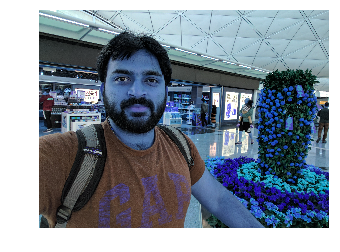

In [5]:
plt.axis("off")
%time plt.imshow(image)

So I had a small helper function in image_utils module.

*** Importing image_utils module ***

```python
import sys

sys.path.append('/code/opencv_tutorials') # path to image_utils.py
from image_utils import Ipy
```

Ipy.imshow helper function looks as below
```python
@staticmethod
def imshow(input_image):
    """
    API to show mini image in ipython notebook, using matplotlib
    """
    import matplotlib.pyplot as plt

    cv_rgb = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
    plt.axis("off")
    plt.imshow(cv_rgb)
```

CPU times: user 320 ms, sys: 10 ms, total: 330 ms
Wall time: 328 ms


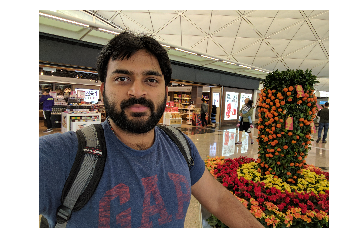

In [6]:
%time Ipy.imshow(image)

If we see the above image, it is small and not clear. So I had another helper function to show the bigger clear image.

Ipy.imshow_large helper function looks as below.

```python
@staticmethod
def imshow_large(input_image):
    """
    API is to show bigger images in ipython notebook. Uses PIL, IPython.display and BytesIO
    """
    from PIL import Image
    import IPython.display
    from io import BytesIO

    rgb_img = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
    img = Image.fromarray(rgb_img)

    b = BytesIO()
    img.save(b, format='png')

    IPython.display.display(IPython.display.Image(data=b.getvalue(), format='png', embed=True))
```

*** Caveat beeing this take longer time to show the image ***

CPU times: user 3.13 s, sys: 0 ns, total: 3.13 s

Wall time: 3.13 s

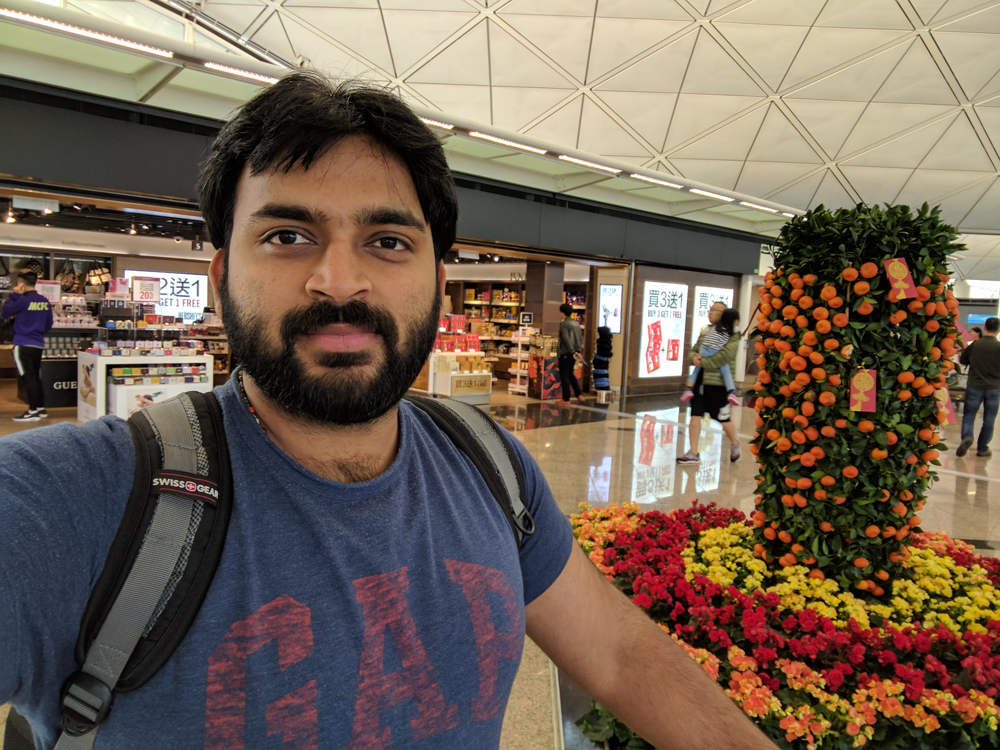

CPU times: user 3.13 s, sys: 0 ns, total: 3.13 s
Wall time: 3.13 s


In [7]:
%time Ipy.imshow_large(image)